## **Import Libraries**

In [2]:
# Importing Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, roc_auc_score, precision_score, recall_score, accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.multioutput import MultiOutputClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from wordcloud import WordCloud, STOPWORDS
from geopy.geocoders import Nominatim
import folium
import plotly.graph_objs as go
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Embedding, GlobalMaxPool1D, Dropout, Conv1D, Activation, Input, LSTM
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall
import tensorflow as tf


## **Load The Data**

In [4]:
df = pd.read_csv('Datafiniti_Fast_Food_Restaurants_May19.csv')

## **Looking Into Data**

In [6]:
#lets take a look 
df

,id,dateAdded,dateUpdated,address,categories,primaryCategories,city,country,keys,latitude,longitude,name,postalCode,province,sourceURLs,websites
0,AWrSh_KgsVYjT2BJAzaH,2019-05-19T23:58:05Z,2019-05-19T23:58:05Z,2555 11th Avenue,"Fast Food Restaurants,Hamburgers and Hot Dogs,...",Accommodation & Food Services,Greeley,US,us/co/greeley/255511thavenue/554191587,40.396290,-104.696990,Carl's Jr.,80631,CO,https://www.yellowpages.com/greeley-co/mip/car...,https://www.carlsjr.com/?utm_source=Yextandutm...
1,AWEKlA-LIxWefVJwxG9B,2018-01-18T18:30:23Z,2019-05-19T23:45:05Z,2513 Highway 6 And 50,"Restaurant,Mexican Restaurants,Fast Food Resta...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/2513highway6and50/1550891556,39.081350,-108.586890,Del Taco,81505,CO,http://www.citysearch.com/profile/772076870/gr...,http://www.deltaco.com
2,AWrSfAcYsVYjT2BJAzPt,2019-05-19T23:45:04Z,2019-05-19T23:45:04Z,1125 Patterson Road,"Sandwich Shops,Fast Food Restaurants,Restauran...",Accommodation & Food Services,Grand Junction,US,us/co/grandjunction/1125pattersonroad/-2137447852,39.091480,-108.554110,Which Wich,81506,CO,https://www.yellowpages.com/grand-junction-co/...,http://www.whichwich.com
3,AWrSa3NAQTFama1Xpkbz,2019-05-19T23:26:58Z,2019-05-19T23:26:58Z,3455 N Salida Court,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Aurora,US,us/co/aurora/3455nsalidacourt/1143321601,39.763690,-104.776710,Chipotle Mexican Grill,80011,CO,https://www.yellowpages.com/aurora-co/mip/chip...,http://www.chipotle.com
4,AWrSaVGzZ4Yw-wtdgcaB,2019-05-19T23:24:38Z,2019-05-19T23:24:38Z,5225 E Colfax Avenue,"Fast Food Restaurants,Mexican Restaurants,Rest...",Accommodation & Food Services,Denver,US,us/co/denver/5225ecolfaxavenue/-864103396,39.740440,-104.926360,Taco Bell,80220,CO,https://www.yellowpages.com/denver-co/mip/taco...,https://locations.tacobell.com/co/denver/5225-...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,AVwd7U0T_7pvs4fz-fS_,2016-05-31T13:33:45Z,2018-12-03T09:04:19Z,1803 Carolina Ave,"American Restaurants,Caterers,Soul Food Restau...",Accommodation & Food Services,Bessemer,US,us/al/bessemer/1803carolinaave/785498836,33.399574,-86.951050,Church's Chicken Of Birmingham,35020,AL,http://www.yellowpages.com/bessemer-al/mip/chu...,http://www.churchs.com
9996,AV1XW1fF3D1zeR_xFKHL,2017-07-18T20:19:50Z,2018-12-02T00:08:36Z,8511 Cantilever Way Ste 105,"Mexican Restaurants,Caterers,Delicatessens,Iri...",Accommodation & Food Services,Raleigh,US,us/nc/raleigh/8511cantileverwayste105/-1596320866,35.884500,-78.737541,Luxury Box,27613-6996,NC,https://www.bbb.org/us/nc/raleigh/profile/spor...,"http://www.theluxuryboxofraleigh.com,http://th..."
9997,AV5UVbkiRxPSIh2RiQxV,2017-09-05T23:05:50Z,2018-12-01T07:38:03Z,2601 Plover Rd,"Carry-out food,Hot dog restaurants,Fast Food R...",Accommodation & Food Services,Plover,US,us/wi/plover/2601ploverrd/-1161002137,44.453180,-89.543170,McDonald's,54467,WI,https://www.yellowpages.com/plover-wi/mip/mcdo...,"http://mcdonalds.com,http://www.mcdonalds.com/..."
9998,AVwc9BxYByjofQCxj_GW,2016-03-31T02:43:12Z,2018-12-01T07:35:22Z,170 E Main St,"Carry-out food,Caterers,Restaurant delivery se...",Accommodation & Food Services,Hendersonville,US,us/tn/hendersonville/170emainst/-66712705,36.308262,-86.607339,Pizza Hut,37075,TN,https://foursquare.com/v/pizza-hut/4c5fffd43a3...,http://www.pizzahut.com


In [7]:
df.shape

(10000, 16)

In [8]:
#checking dfthe info 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 10000 non-null  object 
 1   dateAdded          10000 non-null  object 
 2   dateUpdated        10000 non-null  object 
 3   address            10000 non-null  object 
 4   categories         10000 non-null  object 
 5   primaryCategories  10000 non-null  object 
 6   city               10000 non-null  object 
 7   country            10000 non-null  object 
 8   keys               10000 non-null  object 
 9   latitude           10000 non-null  float64
 10  longitude          10000 non-null  float64
 11  name               10000 non-null  object 
 12  postalCode         10000 non-null  object 
 13  province           10000 non-null  object 
 14  sourceURLs         10000 non-null  object 
 15  websites           9918 non-null   object 
dtypes: float64(2), object(1

In [9]:
#checking null values
df.isna().sum()

id                    0
dateAdded             0
dateUpdated           0
address               0
categories            0
primaryCategories     0
city                  0
country               0
keys                  0
latitude              0
longitude             0
name                  0
postalCode            0
province              0
sourceURLs            0
websites             82
dtype: int64

In [10]:
# Handling missing values in 'websites' column
df['websites'].fillna('Unknown', inplace=True)

there is only null values in website variable.

<Axes: xlabel='city'>

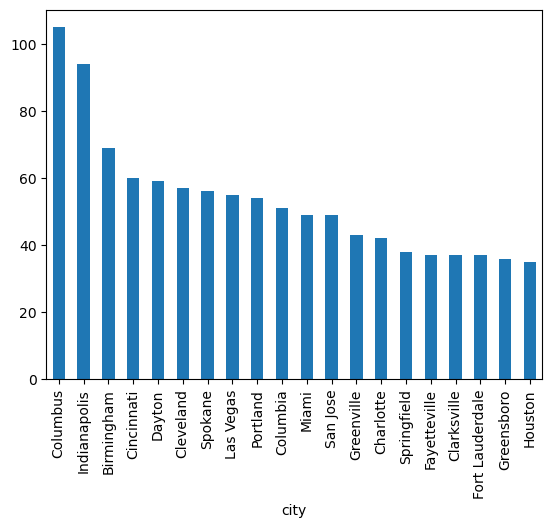

In [12]:
#looking into city variable
df['city'].value_counts()[:20].plot(kind= 'bar')

<Axes: xlabel='name'>

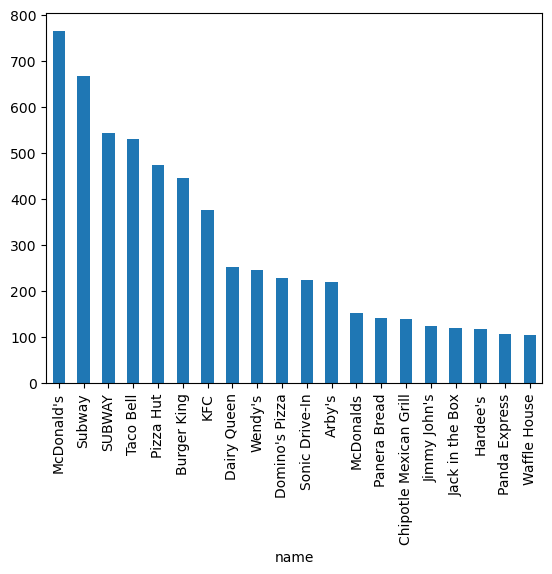

In [13]:
df['name'].value_counts()[:20].plot(kind= 'bar')

# **Data Cleaing**

we are going to work on catageroy variable and in that variable there is some noise we have to remove.

In [15]:
df['new_categories']=df['categories'].apply(lambda x:x.lower())

df[['categories','new_categories']].head(5)

,categories,new_categories
0,"Fast Food Restaurants,Hamburgers and Hot Dogs,...","fast food restaurants,hamburgers and hot dogs,..."
1,"Restaurant,Mexican Restaurants,Fast Food Resta...","restaurant,mexican restaurants,fast food resta..."
2,"Sandwich Shops,Fast Food Restaurants,Restauran...","sandwich shops,fast food restaurants,restauran..."
3,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food restaurants,mexican restaurants,rest..."
4,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food restaurants,mexican restaurants,rest..."


## **Removing Stop Words**

In [17]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Vivek.Nakka\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [18]:
stop_words = set(stopwords.words('english'))

df['new_categories'] = df['categories'].str.lower().apply(
    lambda x: " ".join(word for word in x.split() if word not in stop_words)
)

df[['categories','new_categories']].head(5)

,categories,new_categories
0,"Fast Food Restaurants,Hamburgers and Hot Dogs,...","fast food restaurants,hamburgers hot dogs,rest..."
1,"Restaurant,Mexican Restaurants,Fast Food Resta...","restaurant,mexican restaurants,fast food resta..."
2,"Sandwich Shops,Fast Food Restaurants,Restauran...","sandwich shops,fast food restaurants,restauran..."
3,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food restaurants,mexican restaurants,rest..."
4,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food restaurants,mexican restaurants,rest..."


## **Removing unwanted text patterns from the categories**

In [20]:
# Remove unwanted text patterns from 'new_categories' efficiently
unwanted_terms = [
    'restaurants', 'restaurant', 'take out', 'carry-out food', 'manufacturers',
    'cypress station', 'caterers', 'delivery service', 'uncategorized', 
    "women's clothing", 'delis', 'hotels and motel', '&', 'catering', 
    'airport devonshire', 'airport', 'bars', '- full service', 'clubs', 
    'pubs', 'american canoga park', 'american cape fear', 
    'american downtown blacksburg'
]

for term in unwanted_terms:
    df['new_categories'] = df['new_categories'].str.replace(term, '', regex=True)


In [21]:
df[['categories','new_categories']].head(5)

,categories,new_categories
0,"Fast Food Restaurants,Hamburgers and Hot Dogs,...","fast food ,hamburgers hot dogs,"
1,"Restaurant,Mexican Restaurants,Fast Food Resta...",",mexican ,fast food ,"
2,"Sandwich Shops,Fast Food Restaurants,Restauran...","sandwich shops,fast food ,,take"
3,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food ,mexican ,,take"
4,"Fast Food Restaurants,Mexican Restaurants,Rest...","fast food ,mexican ,"


# **EDA**

## **checking unique values from each colum**

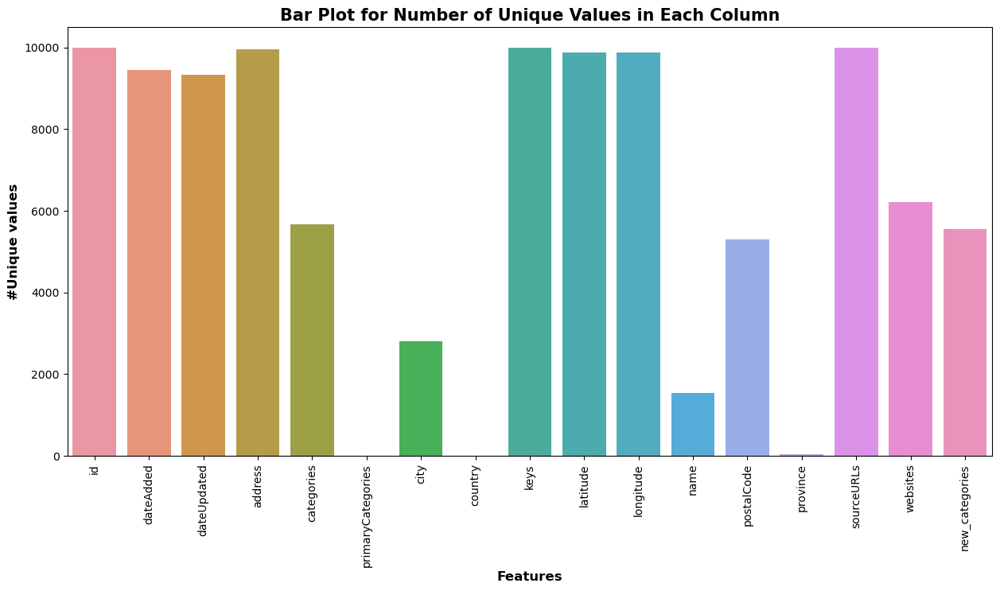

In [24]:
# Creating a summary DataFrame for number of unique values in each column
unique_df = pd.DataFrame()
unique_df['Features'] = df.columns
unique_df['Uniques'] = [df[col].nunique() for col in df.columns]

# Plotting the unique values
plt.figure(figsize=(15, 7))
sns.barplot(x=unique_df['Features'], y=unique_df['Uniques'], alpha=1)
plt.title('Bar Plot for Number of Unique Values in Each Column', weight='bold', size=15)
plt.ylabel('#Unique values', size=12, weight='bold')
plt.xlabel('Features', size=12, weight='bold')
plt.xticks(rotation=90)
plt.show()


Observations :
1. we have data from only one country US and nearly about  from 2810 cities.
2. we have data from 47 province.

## **Understanding the common words used in the new_categories: WordCloud**

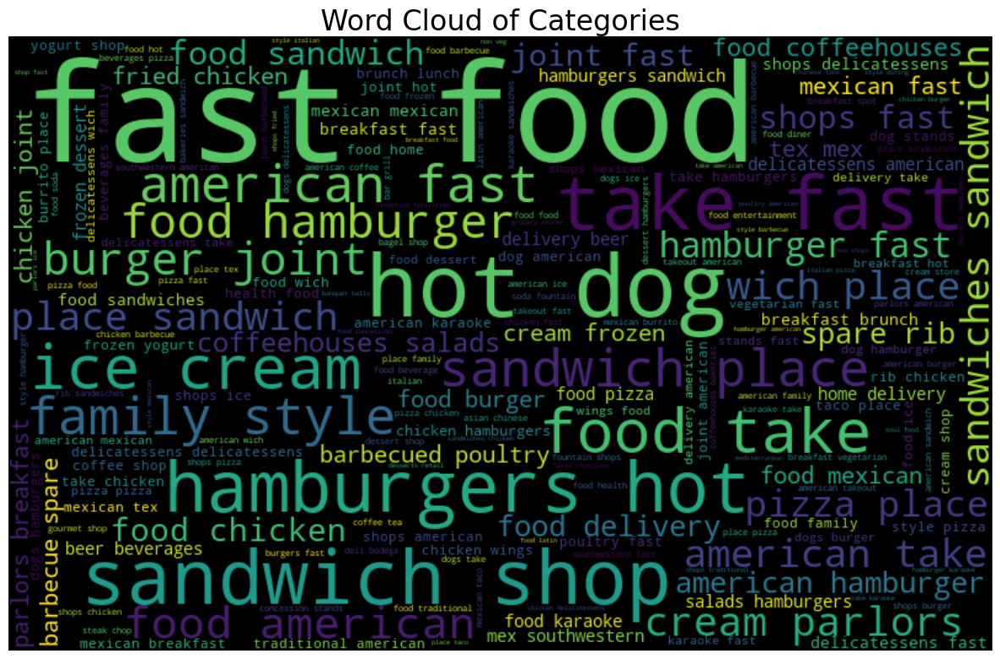

In [27]:
all_words = ' '.join([text for text in df['new_categories']])
wordcloud = WordCloud(width=800, height=500, random_state=42, max_font_size=110).generate(all_words)

plt.figure(figsize=(15, 15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of Categories", fontsize=24)
plt.show()


In [28]:
#for the count of rest. area wise we groupby addres and count of rest. reat_name
df1 = df.groupby(['province'])['name'].aggregate('count').reset_index().sort_values('name', ascending=False)
df1.rename(columns = {'name':'Number_of_resto'}, inplace = True)

In [29]:
#info of df1
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47 entries, 33 to 6
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   province         47 non-null     object
 1   Number_of_resto  47 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.1+ KB


In [30]:
#displaying the values in df1
df1.head(10)

,province,Number_of_resto
33,OH,922
9,FL,739
4,CA,727
26,NC,663
1,AL,635
15,IN,519
40,TX,426
43,WA,404
42,VA,348
35,OR,334


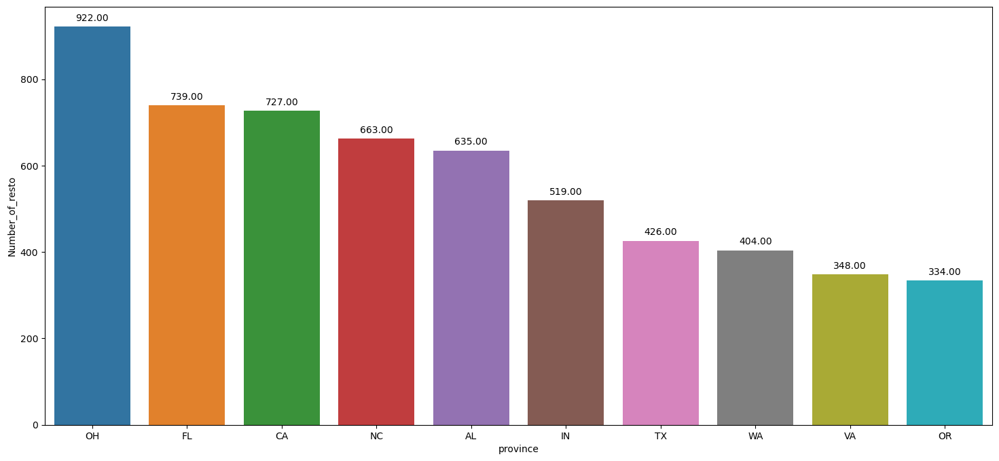

In [31]:
#ploting the graph between restaurnt name and addres
fig , ax = plt.subplots(figsize = (18,8))
splot = sns.barplot(x = 'province', y = 'Number_of_resto' , data = df1.head(10) , ax=ax)

# now simply assign the bar values to
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')

In [32]:
#for the count of rest. city wise we groupby city and count of rest. reat_name
df1 = df.groupby(['city'])['name'].aggregate('count').reset_index().sort_values('name', ascending=False)
df1.rename(columns = {'name':'Number_of_resto'}, inplace = True)

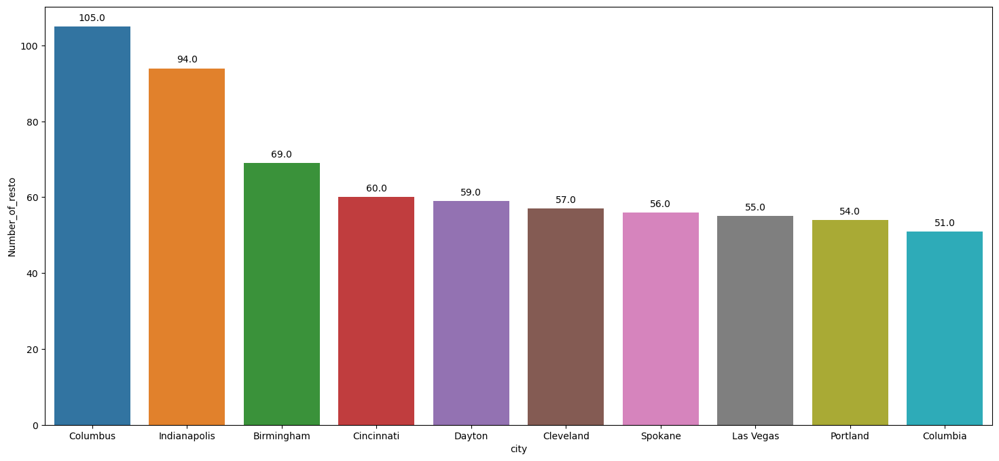

In [33]:
#ploting the graph between restaurnt name and city
fig , ax = plt.subplots(figsize = (18,8))
splot = sns.barplot(x = 'city', y = 'Number_of_resto' , data = df1.head(10) , ax=ax)

# now simply assign the bar values to
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center',
                   va = 'center', xytext = (0, 9), textcoords = 'offset points')

# **Plotting of the Restaurants on map**

In [35]:
from datetime import timedelta
#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import requests # library to handle requests
from pandas import json_normalize  # new line

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

In [36]:
address = 'US'

geolocator = Nominatim(user_agent="tr_explorer", timeout=10)  # Set timeout to 10 seconds
try:
    location = geolocator.geocode(address)
    if location:
        latitude = location.latitude
        longitude = location.longitude
        print('The geographical coordinate of US are {}, {}.'.format(latitude, longitude))
    else:
        print('Location not found.')
except Exception as e:
    print(f"Error occurred: {e}")


The geographical coordinate of US are 39.7837304, -100.445882.


In [37]:
# create map of Toronto using latitude and longitude values
map_bng = folium.Map(location=[latitude, longitude], zoom_start=9)

# add markers to map
for latitude, longitude, address, city in zip(df['latitude'], df['longitude'], df['address'], df['city']):
    label = '{}, {}'.format(address, city)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bng)  
    
map_bng

# **Feature Engineering**

### combining colums to details address

In [40]:
df.fillna('', inplace=True)
df["detailed_address"] = df["name"] + ' ' + df["address"] + ' ' + df["city"] + ' ' + df["country"] + ' ' + df["latitude"].astype(str) + ' ' + df["longitude"].astype(str) + ' ' + df["postalCode"] + ' ' + df['province'] + ' ' + df['websites']

In [41]:
df1 = df[["detailed_address","new_categories"]]

## Creating new variables as we need

In [43]:
new_df = pd.concat([df1.drop('new_categories', axis=1), df['new_categories'].str.get_dummies(sep=",")], axis=1)
print(new_df)

                                       detailed_address            fast food  \
0     Carl's Jr. 2555 11th Avenue Greeley US 40.3962...  0   0             0   
1     Del Taco 2513 Highway 6 And 50 Grand Junction ...  0   0             0   
2     Which Wich 1125 Patterson Road Grand Junction ...  0   0             0   
3     Chipotle Mexican Grill 3455 N Salida Court Aur...  0   0             0   
4     Taco Bell 5225 E Colfax Avenue Denver US 39.74...  0   0             0   
...                                                 ... ..  ..           ...   
9995  Church's Chicken Of Birmingham 1803 Carolina A...  0   0             0   
9996  Luxury Box 8511 Cantilever Way Ste 105 Raleigh...  0   0             0   
9997  McDonald's 2601 Plover Rd Plover US 44.45318 -...  0   0             0   
9998  Pizza Hut 170 E Main St Hendersonville US 36.3...  1   0             0   
9999  Burger King 3400 Westgate Drive Durham US 35.9...  0   0             0   

       american    american  canoga par

In [44]:
new_df

,detailed_address,,,fast food,american,american canoga park,american cape fear,american downtown blacksburg,asian,bakery,...,wings,wings joint,wings joint,wings joint bbq joint,wings joint fried chicken joint,wy\\mexican,yogurt,yogurt,youngstown,yuma
0,Carl's Jr. 2555 11th Avenue Greeley US 40.3962...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Del Taco 2513 Highway 6 And 50 Grand Junction ...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Which Wich 1125 Patterson Road Grand Junction ...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Chipotle Mexican Grill 3455 N Salida Court Aur...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Taco Bell 5225 E Colfax Avenue Denver US 39.74...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,Church's Chicken Of Birmingham 1803 Carolina A...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9996,Luxury Box 8511 Cantilever Way Ste 105 Raleigh...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9997,McDonald's 2601 Plover Rd Plover US 44.45318 -...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,Pizza Hut 170 E Main St Hendersonville US 36.3...,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [45]:
new_df.columns

Index(['detailed_address', ' ', '  ', '   fast food', ' american ',
       ' american  canoga park', ' american  cape fear',
       ' american  downtown blacksburg', ' asian ', ' bakery',
       ...
       'wings', 'wings joint', 'wings joint ', 'wings joint bbq joint',
       'wings joint fried chicken joint', 'wy\\mexican ', 'yogurt', 'yogurt ',
       'youngstown ', 'yuma '],
      dtype='object', length=1491)

In [46]:
#to see columns converting it into list
columns = new_df.columns.tolist()

so munch noise . unwanted variables are present in the data

In [48]:
'''#printing all colm names 
for x in range(len(columns)):
    print (columns[x])'''

'#printing all colm names \nfor x in range(len(columns)):\n    print (columns[x])'

In [49]:
# dropping unwanted variables
new_df1 =new_df.drop([ 'lounge','mediterranean' , 'office' ,'australian','auto leasing','auto renting','auto repairing','automated teller machines (atm)',
                      'autos','baby gear','baby products','bagels','bagels','bakeries',"bakers' supplies",'bakery','bakery' ,'bar supplies','barbecue grills supplies',
                      'barboursville ','bartending service','bath products','beauty salons','bedding','beverage','beverages','beverages retail','big box store',
                      'billiard parlors','billiard table ','biosil','birmingham ', 'bistro','bistro', 'bistros','black mountain ', 'bladensburg ', 'bliss',
                      'blytheville ', 'bothell ', 'bowling','box lunches','braun','brew ', 'brewers','brookneal ', 'brooksville ', 'broomall ' ,'brunch' ,'buffet' 
                      ,'buffet'  ,'building contractors', 'business  personal coaches','business development','business schools','business services','cabinets',
                      'cable internet','cable tv','caf','caf diplomat','cafes','cafeteria ', 'cafeterias','canby ','canonsburg ','cantonese ','carnivals','carpenters',
                      'carry out','cary ','casino','cedar hill ','cedar rapids ','centre ','centreville ', 'chain','chain ','charleston ','charlotte ','cheap eats',
                      'check cashing service','chelsea ','child care','childersburg ',"children's clothing",'clarisonic','clayton ','clermont ','clothing',
                      'clothing alterations','cocktail bar','cocoa ','coffee brewing devices','coffee makers','coffee retail','coffee tea','coffeehouses',
                      'collectibles','college academic building','college quad','columbus ','comfort food ','commercial photographers','commercial printing',
                      'commercial refrigerators','communications','computer internet services','computer online services','concessionaires','construction storage',
                      'consumer electronics','copy centers','copying  duplicating services','corolla ','cosmetics','crab house ','craft supplies','craig ', 
                      'creole  cajun ', 'creole cajun ' ,'crestview acres','crooksville ' ,'crosstown plaza','crystal river ','cumberland furnace ','cuyahoga falls ' 
                      ,'dayton','dayton','delivery','deordorant','delicatessen','delicatessen', 'des moines ','dialysis','dialysis clinics','diesel fuel','discover',
                      'dive ','doctor','dog run','dothan ','dvd','e commerce','e-commerce','eastern european ', 'eating','educational materials',
                      'educational service-business','electric contractors','electronic publishing','employment opportunities','english ' ,
                      'engravers','entertainment  arts','essential oils','ethnic food markets','ethnic markets','european','event planners','event planning',
                      'event ticket agencies','evergreen ' ,'exporters','face cleansers','family ' ,'family entertainment','family-friendly dining','farming service',
                      'farmington ' ,'farms','filipino','finance  financial services','financial planning','fine dining ','fish  seafood markets','fish  seafood retail',
                      'fish market','fishing tackle','florists','food  beverage s','food  dining','food  entertainment','food court','food dining','food drink',
                      'food east columbus','food products','food s','food service','food service management','food truck','foods','forever living','fort pierce ',
                      'franchising','fund raising games','fur repair','furniture','fusion','fusion ','gadsden ','gainesville ', 'garden centers','garment services',
                      'gas station','gay lesbian ','general contractors','general entertainment','general merchandise-retail','geologists','german ','gillette',
                      'gladstone ', 'gluten-free','gluten-free','global','glue','gluten-free foods','golf courses','golf practice ranges','gourmet ', 'grand island ',
                      'grants pass ','greek  park 100','green products','grocers-ethnic foods','hair care products','hand sanitizer','hawaiian', 'headquarters',
                      'health care providers','health clinics', 'health food ','health food store','health medical services','healthy','hermiston ', 'hilo ',
                      'historic sites','historic walking areas','holding companies','home furnishings','home services  furnishings','hospitals','hotel bar',
                      'hunan ', 'huntersville','huntersville', 'huntington ', ], axis=1)

In [50]:
new_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 1249 entries, detailed_address to yuma 
dtypes: int64(1248), object(1)
memory usage: 95.3+ MB


Reduced Columns 1491 to 1249

In [53]:
bar_plot = pd.DataFrame()
bar_plot['cat'] = new_df1.columns[1:]
bar_plot['count'] = new_df1.iloc[:,1:].sum().values
bar_plot.sort_values(['count'], inplace=True, ascending=False)
bar_plot.reset_index(inplace=True, drop=True)
bar_plot.head()

,cat,count
0,fast food,8599
1,take,4405
2,american,4182
3,fast food,2733
4,sandwich shops,2714


In [54]:
#taking the cusines that count more than 50
main_categories = bar_plot[bar_plot['count']>50]
categories = main_categories['cat'].values
categories = np.append(categories,'Others')
not_category = []
new_df1['Others'] = 0

for i in new_df1.columns[1:]:
    if i not in categories:
        new_df1.loc[new_df1[i] == 1, 'Others'] = 1
        not_category.append(i)

new_df1.drop(not_category, axis=1, inplace=True)

In [55]:
new_df1 = new_df1.dropna()

In [56]:
main_categories

,cat,count
0,fast food,8599
1,take,4405
2,american,4182
3,fast food,2733
4,sandwich shops,2714
...,...,...
93,convenience stores,55
94,soul food,52
95,banquet halls reception facilities,52
96,family friendly,52


In [57]:
bar_plot1 = pd.DataFrame()
bar_plot1['cat'] = new_df1.columns[1:]
categories1= bar_plot1['cat'].values
categories1 = np.append(categories1,'Others')
categories1

array([' ', ' american ', ' burrito place', ' delicatessens',
       ' fast food ', ' sandwich place', ' taco place', 'american',
       'american ', 'asian ', 'bagel shops',
       'banquet halls reception facilities', 'bar grills', 'barbecue',
       'barbecue ', 'barbecued poultry', 'breakfast',
       'breakfast brunch  lunch ', 'breakfast brunch lunch ',
       'breakfast spot', 'burger joint', 'burgers', 'burrito place',
       'chicken', 'chicken ', 'chicken wings', 'chinese ', 'coffee shops',
       'concession stands', 'convenience stores', 'delicatessens',
       'dessert ', 'dessert shops', 'diner', 'diners', 'family friendly ',
       'family style ', 'family style dining', 'fast food', 'fast food ',
       'fast food  burger joint', 'fast food  mexican ', 'food',
       'food beverage', 'food delivery', 'fried chicken joint',
       'frozen yogurt shops', 'gourmet shop ', 'greek ', 'hamburger ',
       'hamburgers', 'hamburgers  hot dogs', 'hamburgers hot dogs',
       'ho

In [58]:
most_common_cat = pd.DataFrame()
most_common_cat['cat'] = new_df1.columns[1:]
most_common_cat['count'] = new_df1.iloc[:,1:].sum().values
most_common_cat.sort_values(['count'], inplace=True, ascending=False)
most_common_cat.reset_index(inplace=True, drop=True)
most_common_cat.head()

,cat,count
0,fast food,8599
1,take,4405
2,american,4182
3,fast food,2733
4,sandwich shops,2714


In [60]:
# new_df1 = new_df1.dropna()

In [61]:
rowSums = new_df1.iloc[:,1:].sum(axis=1)
multiLabel_counts = rowSums.value_counts()

In [63]:
boxplot = new_df1.copy()
boxplot['len'] = new_df1.detailed_address.apply(lambda x: len(x))

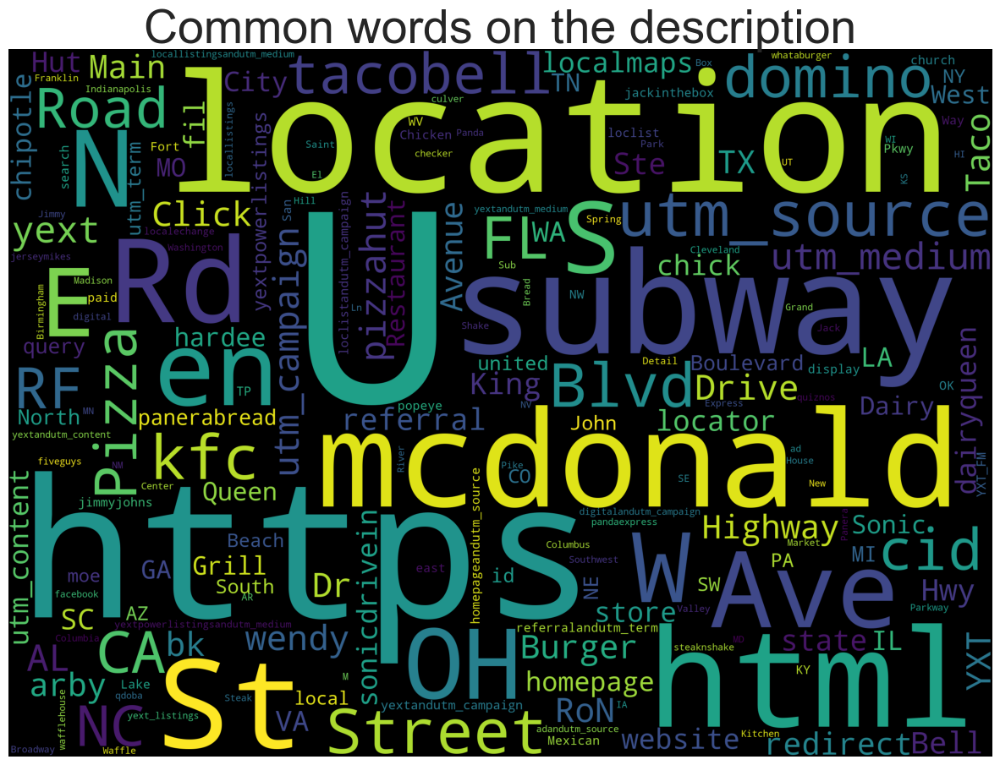

In [65]:
from wordcloud import WordCloud,STOPWORDS

plt.figure(figsize=(15,15))
text = new_df1.detailed_address.values
cloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='black',
                          collocations=False,
                          width=2500,
                          height=1800
                         ).generate(" ".join(text))
plt.axis('off')
plt.title("Common words on the description",fontsize=40)
plt.imshow(cloud)

# **Making columns for result** 

In [67]:
# Create a DataFrame to store results for each model across different metrics
results = pd.DataFrame(columns=['Model', 'AUC', 'Precision', 'Recall', 'F1'])


In [68]:
#
seeds = [1, 43, 678, 90, 135]

In [69]:
t = results.copy()
t

,Model,AUC,Precision,Recall,F1


## **TfidfVectorizer** and train-test spilt

In [71]:
X_train, X_test, y_train, y_test = train_test_split(new_df1['detailed_address'], 
                                                    new_df1[new_df1.columns[1:]], 
                                                    test_size=0.3, 
                                                    random_state=seeds[4], 
                                                    shuffle=True)
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2')
vectorizer.fit(X_train)

X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

# **Models**

In [73]:
# Add this function before the evaluation loops
def train_and_evaluate_model(model_pipeline, model_name, X_train, y_train, X_test, y_test):
    auc = precision = recall = f1 = 0
    total_categories = len(y_train.columns)

    for category in y_train.columns:
        print(f'**Processing {category} titles...**')

        model_pipeline.fit(X_train, y_train[category])
        prediction = model_pipeline.predict(X_test)

        auc += roc_auc_score(y_test[category], prediction)
        precision += precision_score(y_test[category], prediction, zero_division=1)
        recall += recall_score(y_test[category], prediction, zero_division=1)
        f1 += f1_score(y_test[category], prediction, zero_division=1)

    average_auc = auc / total_categories
    average_precision = precision / total_categories
    average_recall = recall / total_categories
    average_f1 = f1 / total_categories

    print(f'Average AUC ROC is {average_auc}')
    print(f'Average Precision is {average_precision}')
    print(f'Average Recall is {average_recall}')
    print(f'Average F1 Score is {average_f1}')

    return {
        'Model': model_name,
        'AUC': average_auc,
        'Precision': average_precision,
        'Recall': average_recall,
        'F1': average_f1
    }


In [75]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier


# Logistic Regression
LR_pipeline = Pipeline([('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1))])
new_result = train_and_evaluate_model(LR_pipeline, 'Logistic Regression (OneVsAll)', X_train, y_train, X_test, y_test)
results = pd.concat([results, pd.DataFrame([new_result])], ignore_index=True)




**Processing   titles...**
**Processing  american  titles...**
**Processing  burrito place titles...**
**Processing  delicatessens titles...**
**Processing  fast food  titles...**
**Processing  sandwich place titles...**
**Processing  taco place titles...**
**Processing american titles...**
**Processing american  titles...**
**Processing asian  titles...**
**Processing bagel shops titles...**
**Processing banquet halls reception facilities titles...**
**Processing bar grills titles...**
**Processing barbecue titles...**
**Processing barbecue  titles...**
**Processing barbecued poultry titles...**
**Processing breakfast titles...**
**Processing breakfast brunch  lunch  titles...**
**Processing breakfast brunch lunch  titles...**
**Processing breakfast spot titles...**
**Processing burger joint titles...**
**Processing burgers titles...**
**Processing burrito place titles...**
**Processing chicken titles...**
**Processing chicken  titles...**
**Processing chicken wings titles...**
**Proc

C:\Users\Vivek.Nakka\AppData\Local\Temp\ipykernel_28848\3392532858.py:14: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, pd.DataFrame([new_result])], ignore_index=True)


In [76]:
from sklearn.naive_bayes import MultinomialNB

# Naive Bayes
NB_pipeline = Pipeline([('clf', OneVsRestClassifier(MultinomialNB(fit_prior=True, class_prior=None)))])
new_result = train_and_evaluate_model(NB_pipeline, 'Naive Bayes', X_train, y_train, X_test, y_test)
results = pd.concat([results, pd.DataFrame([new_result])], ignore_index=True)



**Processing   titles...**
**Processing  american  titles...**
**Processing  burrito place titles...**
**Processing  delicatessens titles...**
**Processing  fast food  titles...**
**Processing  sandwich place titles...**
**Processing  taco place titles...**
**Processing american titles...**
**Processing american  titles...**
**Processing asian  titles...**
**Processing bagel shops titles...**
**Processing banquet halls reception facilities titles...**
**Processing bar grills titles...**
**Processing barbecue titles...**
**Processing barbecue  titles...**
**Processing barbecued poultry titles...**
**Processing breakfast titles...**
**Processing breakfast brunch  lunch  titles...**
**Processing breakfast brunch lunch  titles...**
**Processing breakfast spot titles...**
**Processing burger joint titles...**
**Processing burgers titles...**
**Processing burrito place titles...**
**Processing chicken titles...**
**Processing chicken  titles...**
**Processing chicken wings titles...**
**Proc

In [77]:
from sklearn.svm import LinearSVC

# SVM
SVC_pipeline = Pipeline([('clf', OneVsRestClassifier(LinearSVC(), n_jobs=1))])
new_result = train_and_evaluate_model(SVC_pipeline, 'SVM', X_train, y_train, X_test, y_test)
results = pd.concat([results, pd.DataFrame([new_result])], ignore_index=True)


**Processing   titles...**
**Processing  american  titles...**
**Processing  burrito place titles...**
**Processing  delicatessens titles...**
**Processing  fast food  titles...**
**Processing  sandwich place titles...**
**Processing  taco place titles...**
**Processing american titles...**
**Processing american  titles...**
**Processing asian  titles...**
**Processing bagel shops titles...**
**Processing banquet halls reception facilities titles...**
**Processing bar grills titles...**
**Processing barbecue titles...**
**Processing barbecue  titles...**
**Processing barbecued poultry titles...**
**Processing breakfast titles...**
**Processing breakfast brunch  lunch  titles...**
**Processing breakfast brunch lunch  titles...**
**Processing breakfast spot titles...**
**Processing burger joint titles...**
**Processing burgers titles...**
**Processing burrito place titles...**
**Processing chicken titles...**
**Processing chicken  titles...**
**Processing chicken wings titles...**
**Proc

In [78]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier



# Random Forest
RF_pipeline = Pipeline([('clf', OneVsRestClassifier(RandomForestClassifier(), n_jobs=-1))])
new_result = train_and_evaluate_model(RF_pipeline, 'Random Forest', X_train, y_train, X_test, y_test)
results = pd.concat([results, pd.DataFrame([new_result])], ignore_index=True)






**Processing   titles...**
**Processing  american  titles...**
**Processing  burrito place titles...**
**Processing  delicatessens titles...**
**Processing  fast food  titles...**
**Processing  sandwich place titles...**
**Processing  taco place titles...**
**Processing american titles...**
**Processing american  titles...**
**Processing asian  titles...**
**Processing bagel shops titles...**
**Processing banquet halls reception facilities titles...**
**Processing bar grills titles...**
**Processing barbecue titles...**
**Processing barbecue  titles...**
**Processing barbecued poultry titles...**
**Processing breakfast titles...**
**Processing breakfast brunch  lunch  titles...**
**Processing breakfast brunch lunch  titles...**
**Processing breakfast spot titles...**
**Processing burger joint titles...**
**Processing burgers titles...**
**Processing burrito place titles...**
**Processing chicken titles...**
**Processing chicken  titles...**
**Processing chicken wings titles...**
**Proc

In [79]:
results

,Model,AUC,Precision,Recall,F1
0,Logistic Regression (OneVsAll),0.657817,0.780049,0.336326,0.360521
1,Naive Bayes,0.518003,0.990168,0.047880,0.062817
2,SVM,0.744080,0.719614,0.510077,0.522262
3,Random Forest,0.648583,0.851786,0.314071,0.365423


In [80]:
#this will take so much time so run for only once and save the results
'''from skmultilearn.problem_transform import BinaryRelevance
from sklearn.naive_bayes import GaussianNB

classifier = BinaryRelev(GausancesianNB())
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)
accuracy_score(y_test,predictions)
print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))'''

"from skmultilearn.problem_transform import BinaryRelevance\nfrom sklearn.naive_bayes import GaussianNB\n\nclassifier = BinaryRelev(GausancesianNB())\nclassifier.fit(X_train, y_train)\npredictions = classifier.predict(X_test)\naccuracy_score(y_test,predictions)\nprint('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))"

In [81]:
#results.loc[4,'BinaryRelevance'] = roc_auc_score(y_test,predictions.toarray())
#results

In [82]:
#this will take so much time so run for only once and save the results
'''from skmultilearn.problem_transform import ClassifierChain
from sklearn.linear_model import LogisticRegression

classifier = ClassifierChain(LogisticRegression())
classifier.fit(X_train, y_train)
predictions = classifier.predict(X_test)

print('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))'''

"from skmultilearn.problem_transform import ClassifierChain\nfrom sklearn.linear_model import LogisticRegression\n\nclassifier = ClassifierChain(LogisticRegression())\nclassifier.fit(X_train, y_train)\npredictions = classifier.predict(X_test)\n\nprint('AUC ROC is {}'.format(roc_auc_score(y_test,predictions.toarray())))"

In [83]:
#results.loc[4,'ClassifierChain'] = roc_auc_score(y_test,predictions.toarray())
#results

In [84]:
from sklearn.multioutput import MultiOutputClassifier
from sklearn.neighbors import KNeighborsClassifier

# KNN (Multiple Output)
clf = MultiOutputClassifier(KNeighborsClassifier()).fit(X_train, y_train)
predictions = clf.predict(X_test)

auc = roc_auc_score(y_test, predictions, average='macro')
precision = precision_score(y_test, predictions, average='macro', zero_division=1)
recall = recall_score(y_test, predictions, average='macro', zero_division=1)
f1 = f1_score(y_test, predictions, average='macro', zero_division=1)

print(f'AUC ROC: {auc}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

knn_result = {
    'Model': 'MultipleOutput (KNN)',
    'AUC': auc,
    'Precision': precision,
    'Recall': recall,
    'F1': f1
}
results = pd.concat([results, pd.DataFrame([knn_result])], ignore_index=True)





AUC ROC: 0.668906977888435
Precision: 0.6730134455076
Recall: 0.36241426473221516
F1 Score: 0.4092379927143408


# **Deep Learning**
Word Embedding

In [86]:
# Helper function to evaluate deep learning model predictions
def evaluate_model(model, X_test, y_test):
    predictions = model.predict(X_test)
    # Convert predictions to binary values (threshold at 0.5)
    predictions_binary = (predictions > 0.5).astype(int)

    auc = roc_auc_score(y_test, predictions_binary, average='macro')
    precision = precision_score(y_test, predictions_binary, average='macro', zero_division=1)
    recall = recall_score(y_test, predictions_binary, average='macro', zero_division=1)
    f1 = f1_score(y_test, predictions_binary, average='macro', zero_division=1)

    print(f'AUC ROC: {auc}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')
    print(f'F1 Score: {f1}')

    return auc, precision, recall, f1


In [87]:
new_df1['detailed_address']

0       Carl's Jr. 2555 11th Avenue Greeley US 40.3962...
1       Del Taco 2513 Highway 6 And 50 Grand Junction ...
2       Which Wich 1125 Patterson Road Grand Junction ...
3       Chipotle Mexican Grill 3455 N Salida Court Aur...
4       Taco Bell 5225 E Colfax Avenue Denver US 39.74...
                              ...                        
9995    Church's Chicken Of Birmingham 1803 Carolina A...
9996    Luxury Box 8511 Cantilever Way Ste 105 Raleigh...
9997    McDonald's 2601 Plover Rd Plover US 44.45318 -...
9998    Pizza Hut 170 E Main St Hendersonville US 36.3...
9999    Burger King 3400 Westgate Drive Durham US 35.9...
Name: detailed_address, Length: 10000, dtype: object

In [88]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words=5000, lower=True)
tokenizer.fit_on_texts(new_df1['detailed_address'])
sequences = tokenizer.texts_to_sequences(new_df1['detailed_address'])
x = pad_sequences(sequences, maxlen=200)

In [89]:
X_train, X_test, y_train, y_test = train_test_split(x, 
                                                    new_df1[new_df1.columns[1:]], 
                                                    test_size=0.3, 
                                                    random_state=seeds[4])

In [90]:
# Remove duplicate class_weight calculation and generalize
most_common_cat['class_weight'] = len(most_common_cat) / most_common_cat['count']

# Generalized class weight calculation by converting it to a dictionary
class_weight = most_common_cat.set_index('cat')['class_weight'].to_dict()


# Display the updated DataFrame
most_common_cat.head()

,cat,count,class_weight
0,fast food,8599,0.011513
1,take,4405,0.022474
2,american,4182,0.023673
3,fast food,2733,0.036224
4,sandwich shops,2714,0.036478


In [91]:
num_classes = y_train.shape[1]
max_words = len(tokenizer.word_index) + 1
maxlen = 200

# **DNN**

In [93]:
from tensorflow.keras.optimizers import Adam # - Works

In [94]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, GlobalMaxPool1D, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.metrics import Precision, Recall

# Define the model
model = Sequential()

# Updated Embedding layer (Removed input_length argument as it is deprecated)
model.add(Embedding(input_dim=max_words, output_dim=20))

# Adding a dropout layer (uncomment if you need it)
# model.add(Dropout(0.2))

# GlobalMaxPool1D and final Dense layer
model.add(GlobalMaxPool1D())
model.add(Dense(num_classes, activation='sigmoid'))

# Compile the model


model.compile(optimizer='adam', 
              loss='binary_crossentropy', 
              metrics=[tf.keras.metrics.AUC(), Precision(), Recall()])


# Callbacks
callbacks = [
    ReduceLROnPlateau(),
    # Uncomment if you need early stopping
    # EarlyStopping(patience=10),
    ModelCheckpoint(filepath='model-simple.keras', save_best_only=True)  # Use `.keras` file extension as per the new standard
]

# Fit the model
history = model.fit(
    X_train, 
    y_train,
    class_weight=class_weight,
    epochs=30,
    batch_size=32,
    validation_split=0.3,
    callbacks=callbacks
)


Epoch 1/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - auc: 0.6083 - loss: 0.5615 - precision: 0.0857 - recall: 0.3766 - val_auc: 0.7932 - val_loss: 0.1776 - val_precision: 0.8587 - val_recall: 0.1473 - learning_rate: 0.0010
Epoch 2/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - auc: 0.8201 - loss: 0.1701 - precision: 0.8397 - recall: 0.1455 - val_auc: 0.8427 - val_loss: 0.1666 - val_precision: 0.8633 - val_recall: 0.1465 - learning_rate: 0.0010
Epoch 3/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - auc: 0.8470 - loss: 0.1642 - precision: 0.8532 - recall: 0.1463 - val_auc: 0.8499 - val_loss: 0.1644 - val_precision: 0.8633 - val_recall: 0.1465 - learning_rate: 0.0010
Epoch 4/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - auc: 0.8491 - loss: 0.1632 - precision: 0.8545 - recall: 0.1484 - val_auc: 0.8550 - val_loss: 0.1616 - val_precision: 0.8546 - val_recall: 0.1611 - learning_rate: 0.0010
Epoch 5/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - auc: 0.8606 - loss: 0.1592 - precision: 0.837

In [95]:
dnn_model = model
# Metrics evaluation for DNN Model
metrics = evaluate_model(dnn_model, X_test, y_test)
dnn_result = {
    'Model': 'DNN',
    'AUC': metrics[0],
    'Precision': metrics[1],
    'Recall': metrics[2],
    'F1': metrics[3]
}
results = pd.concat([results, pd.DataFrame([dnn_result])], ignore_index=True)





94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
AUC ROC: 0.5648314786038535
Precision: 0.8944770915876347
Recall: 0.14519819006221737
F1 Score: 0.16007296269461993


# **CNN**

In [97]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Embedding, Flatten, GlobalMaxPool1D, Dropout, Conv1D
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

filter_length = 300

# Define the model
model = Sequential()

# Updated Embedding layer (Removed input_length argument)
model.add(Embedding(input_dim=max_words, output_dim=20))

# Optionally add dropout
# model.add(Dropout(0.5))

# Add 1D Convolution layer
model.add(Conv1D(filters=filter_length, kernel_size=3, padding='valid', activation='relu', strides=1))

# Add pooling and output layers
model.add(GlobalMaxPool1D())
model.add(Dense(num_classes))
model.add(Activation('sigmoid'))

# Compile the model

model.compile(optimizer='adam', 
              loss='binary_crossentropy', 
              metrics=[tf.keras.metrics.AUC(), Precision(), Recall()])

# Define callbacks
callbacks = [
    ReduceLROnPlateau(),
    ModelCheckpoint(filepath='model-conv1d.keras', save_best_only=True)  # Updated to use `.keras` extension
]

# Fit the model
history = model.fit(
    X_train,
    y_train,
    class_weight=class_weight,
    epochs=30,
    batch_size=32,
    validation_split=0.3,
    callbacks=callbacks
)


Epoch 1/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - auc_1: 0.6944 - loss: 0.3523 - precision_1: 0.3101 - recall_1: 0.2187 - val_auc_1: 0.8708 - val_loss: 0.1556 - val_precision_1: 0.8619 - val_recall_1: 0.1811 - learning_rate: 0.0010
Epoch 2/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - auc_1: 0.8969 - loss: 0.1412 - precision_1: 0.7822 - recall_1: 0.2712 - val_auc_1: 0.9399 - val_loss: 0.1161 - val_precision_1: 0.7678 - val_recall_1: 0.4203 - learning_rate: 0.0010
Epoch 3/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step - auc_1: 0.9493 - loss: 0.1087 - precision_1: 0.7586 - recall_1: 0.4711 - val_auc_1: 0.9586 - val_loss: 0.1005 - val_precision_1: 0.7676 - val_recall_1: 0.5090 - learning_rate: 0.0010
Epoch 4/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - auc_1: 0.9656 - loss: 0.0936 - precision_1: 0.7792 - recall_1: 0.5566 - val_auc_1: 0.9662 - val_loss: 0.0922 - val_precision_1: 0.7695 - val_recall_1: 0.5847 - learning_rate: 0.0010
Epoch 5/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/st

In [98]:
cnn_model = model
# Metrics evaluation for CNN Model
metrics = evaluate_model(cnn_model, X_test, y_test)

cnn_result = {
    'Model': 'CNN',
    'AUC': metrics[0],
    'Precision': metrics[1],
    'Recall': metrics[2],
    'F1': metrics[3]
}

# Use pd.concat to add the new result to results DataFrame
results = pd.concat([results, pd.DataFrame([cnn_result])], ignore_index=True)


94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
AUC ROC: 0.7016478839080665
Precision: 0.6433334407109628
Recall: 0.4236168018810426
F1 Score: 0.46938789325342


# **GloVe - LSTM** 

In [101]:
from numpy import array
from numpy import asarray
from numpy import zeros

embeddings_dictionary = dict()

glove_file = open('glove.6B.100d.txt', encoding="utf8")

for line in glove_file:
    records = line.split()
    word = records[0]
    vector_dimensions = asarray(records[1:], dtype='float32')
    embeddings_dictionary[word] = vector_dimensions
glove_file.close()

embedding_matrix = zeros((max_words, 100))
for word, index in tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

In [102]:
from tensorflow.keras.layers import Input, Flatten, LSTM, Dense, Embedding
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
import tensorflow as tf

# Input layer
deep_inputs = Input(shape=(maxlen,))

# Embedding layer using pre-trained weights (trainable=False)
embedding_layer = Embedding(input_dim=max_words, output_dim=100, weights=[embedding_matrix], trainable=False)(deep_inputs)

# LSTM layer
LSTM_Layer_1 = LSTM(128)(embedding_layer)

# Dense output layer
dense_layer_1 = Dense(99, activation='sigmoid')(LSTM_Layer_1)

# Creating the model
model = Model(inputs=deep_inputs, outputs=dense_layer_1)

# Callbacks - Updated ModelCheckpoint to use `.keras` extension
callbacks = [
    ReduceLROnPlateau(),
    ModelCheckpoint(filepath='model-lstm.keras', save_best_only=True)  # Updated the file extension to `.keras`
]

# Compiling the model
from tensorflow.keras.metrics import Precision, Recall

model.compile(optimizer='adam', 
              loss='binary_crossentropy', 
              metrics=[tf.keras.metrics.AUC(), Precision(), Recall()])


# Fitting the model
history = model.fit(
    X_train, 
    y_train.values,
    class_weight=class_weight,
    batch_size=32,
    epochs=30,
    validation_split=0.3,
    callbacks=callbacks
)


Epoch 1/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 49s 269ms/step - auc_2: 0.7090 - loss: 0.3071 - precision_2: 0.2396 - recall_2: 0.2112 - val_auc_2: 0.8480 - val_loss: 0.1640 - val_precision_2: 0.8633 - val_recall_2: 0.1465 - learning_rate: 0.0010
Epoch 2/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 39s 253ms/step - auc_2: 0.8563 - loss: 0.1592 - precision_2: 0.8268 - recall_2: 0.1573 - val_auc_2: 0.8676 - val_loss: 0.1552 - val_precision_2: 0.8237 - val_recall_2: 0.1869 - learning_rate: 0.0010
Epoch 3/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - auc_2: 0.8766 - loss: 0.1495 - precision_2: 0.7865 - recall_2: 0.2162 - val_auc_2: 0.8860 - val_loss: 0.1468 - val_precision_2: 0.7957 - val_recall_2: 0.2549 - learning_rate: 0.0010
Epoch 4/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 39s 255ms/step - auc_2: 0.8920 - loss: 0.1421 - precision_2: 0.7761 - recall_2: 0.2762 - val_auc_2: 0.8944 - val_loss: 0.1430 - val_precision_2: 0.7667 - val_recall_2: 0.2795 - learning_rate: 0.0010
Epoch 5/30
154/154 ━━━━━━━━━━━━━━━━━━━━ 40s 

In [103]:
# Metrics evaluation for LSTM Model
lstm_model = model
# Metrics evaluation for LSTM Model
metrics = evaluate_model(lstm_model, X_test, y_test)

lstm_result = {
    'Model': 'LSTM',
    'AUC': metrics[0],
    'Precision': metrics[1],
    'Recall': metrics[2],
    'F1': metrics[3]
}

# Use pd.concat to add the new result to results DataFrame
results = pd.concat([results, pd.DataFrame([lstm_result])], ignore_index=True)


94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step
AUC ROC: 0.6420697776953551
Precision: 0.8602373365979397
Recall: 0.29866709738329206
F1 Score: 0.34290557515935827


# **ANN**

In [105]:
# # Feature Scaling because yes we don't want one independent variable dominating the other and it makes computations easy
# from sklearn.preprocessing import StandardScaler
# sc = StandardScaler()
# X_train = sc.fit_transform(X_train)
# X_test = sc.transform(X_test)

In [106]:
# sequential model to initialise our ann and dense module to build the layers
from keras.models import Sequential
from keras.layers import Dense
#Initialising ANN
ann = tf.keras.models.Sequential()
 #Adding First Hidden Layer
ann.add(tf.keras.layers.Dense(units=1,activation="relu"))
 #Adding Second Hidden Layer
ann.add(tf.keras.layers.Dense(units=6,activation="relu"))
#Adding Output Layer
ann.add(tf.keras.layers.Dense(units=num_classes,activation="sigmoid"))
#Compiling ANN

ann.compile(optimizer='adam', 
              loss='binary_crossentropy', 
              metrics=[tf.keras.metrics.AUC(), Precision(), Recall()])


In [107]:
# Fitting ANN
ann.fit(X_train, y_train, batch_size=30, epochs=10, validation_split=0.3)

Epoch 1/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - auc_3: 0.5894 - loss: 4.9431 - precision_3: 0.1167 - recall_3: 0.3598 - val_auc_3: 0.6702 - val_loss: 0.7980 - val_precision_3: 0.3466 - val_recall_3: 0.1747
Epoch 2/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - auc_3: 0.6750 - loss: 0.6976 - precision_3: 0.4039 - recall_3: 0.1654 - val_auc_3: 0.6972 - val_loss: 0.5598 - val_precision_3: 0.6599 - val_recall_3: 0.1558
Epoch 3/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc_3: 0.7061 - loss: 0.5298 - precision_3: 0.6888 - recall_3: 0.1551 - val_auc_3: 0.7225 - val_loss: 0.4755 - val_precision_3: 0.8306 - val_recall_3: 0.1542
Epoch 4/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - auc_3: 0.7310 - loss: 0.4537 - precision_3: 0.8299 - recall_3: 0.1515 - val_auc_3: 0.7365 - val_loss: 0.4226 - val_precision_3: 0.8242 - val_recall_3: 0.1565
Epoch 5/10
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - auc_3: 0.7463 - loss: 0.4034 - precision_3: 0.8335 - recall_3: 0.1520 - val_auc_3: 0.7429 - val_l

In [108]:
# Metrics evaluation for ANN Model
metrics = evaluate_model(ann, X_test, y_test)

ann_result = {
    'Model': 'ANN',
    'AUC': metrics[0],
    'Precision': metrics[1],
    'Recall': metrics[2],
    'F1': metrics[3]
}

# Use pd.concat to add the new result to results DataFrame
results = pd.concat([results, pd.DataFrame([ann_result])], ignore_index=True)


94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
AUC ROC: 0.499985238234971
Precision: 0.9844372294372294
Recall: 0.010473072541434295
F1 Score: 0.010096969876414605


# **Results**

In [120]:
def highlight_min(data, color='red'):
    # Create a DataFrame to store the styles
    attr = 'background-color: {}'.format(color)
    is_min = data == data.min().min()
    return pd.DataFrame(np.where(is_min, attr, ''), index=data.index, columns=data.columns)

def highlight_max(data, color='lightgreen'):
    # Create a DataFrame to store the styles
    attr = 'background-color: {}'.format(color)
    is_max = data == data.max().max()
    return pd.DataFrame(np.where(is_max, attr, ''), index=data.index, columns=data.columns)


In [131]:
# Selecting only numeric columns for applying the highlight functions
styled_results = results.style.apply(lambda x: highlight_min(x, color='red'), subset=results.select_dtypes(include=[np.number]).columns, axis=None) \
                              .apply(lambda x: highlight_max(x, color='lightgreen'), subset=results.select_dtypes(include=[np.number]).columns, axis=None)

styled_results


,Model,AUC,Precision,Recall,F1
0,Logistic Regression (OneVsAll),0.657817,0.780049,0.336326,0.360521
1,Naive Bayes,0.518003,0.990168,0.047880,0.062817
2,SVM,0.744080,0.719614,0.510077,0.522262
3,Random Forest,0.648583,0.851786,0.314071,0.365423
4,MultipleOutput (KNN),0.668907,0.673013,0.362414,0.409238
5,DNN,0.564831,0.894477,0.145198,0.160073
6,CNN,0.701648,0.643333,0.423617,0.469388
7,LSTM,0.642070,0.860237,0.298667,0.342906
8,ANN,0.499985,0.984437,0.010473,0.010097


In [132]:
from matplotlib.colors import LinearSegmentedColormap

#cm = sns.light_palette("green", as_cmap=True)
cm = LinearSegmentedColormap.from_list(
    name='test', 
    #colors=['red','white','green','white','red']
    colors=['tomato','orange','white','lightgreen','green']
)

numeric_columns = results.select_dtypes(include=np.number).columns
t = results[numeric_columns].style.background_gradient(cmap=cm)

t

,AUC,Precision,Recall,F1
0,0.657817,0.780049,0.336326,0.360521
1,0.518003,0.990168,0.047880,0.062817
2,0.744080,0.719614,0.510077,0.522262
3,0.648583,0.851786,0.314071,0.365423
4,0.668907,0.673013,0.362414,0.409238
5,0.564831,0.894477,0.145198,0.160073
6,0.701648,0.643333,0.423617,0.469388
7,0.642070,0.860237,0.298667,0.342906
8,0.499985,0.984437,0.010473,0.010097


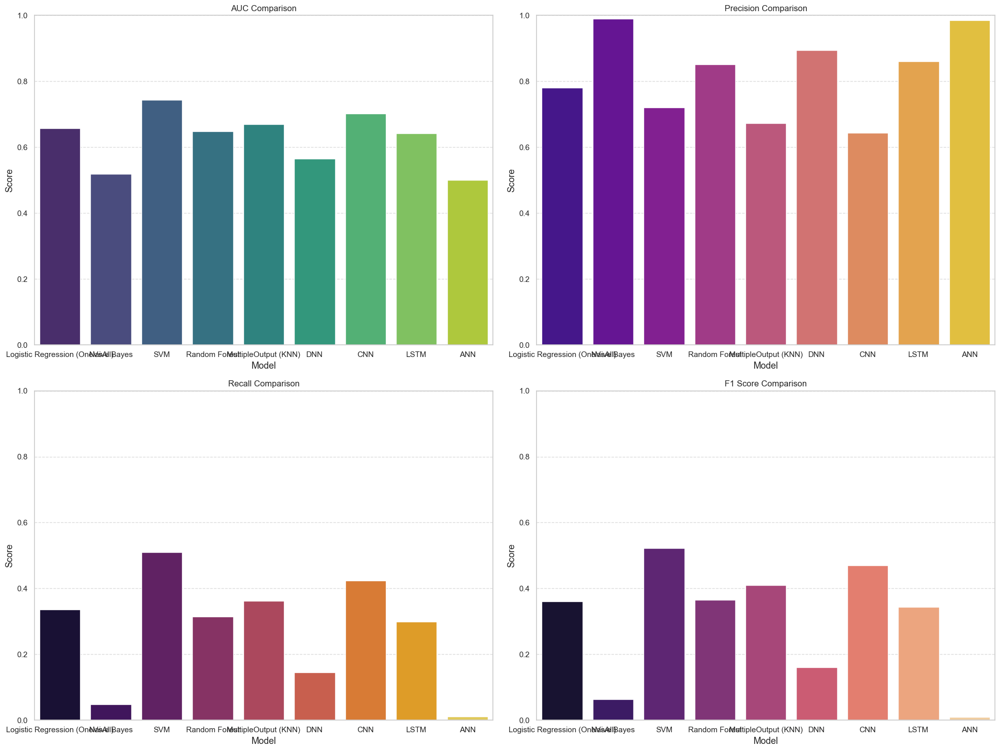

In [133]:
# Convert results dictionary to DataFrame
metrics_data = []

# Extract the data from the results DataFrame
for index, row in results.iterrows():
    metrics_data.append([row['Model'], row['AUC'], row['Precision'], row['Recall'], row['F1']])

metrics_df = pd.DataFrame(metrics_data, columns=['Model', 'AUC', 'Precision', 'Recall', 'F1'])

# Plot the results using bar plots for each metric
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# Plot AUC
sns.barplot(data=metrics_df, x='Model', y='AUC', ax=axes[0, 0], palette='viridis')
axes[0, 0].set_title('AUC Comparison')
axes[0, 0].set_ylim(0, 1)

# Plot Precision
sns.barplot(data=metrics_df, x='Model', y='Precision', ax=axes[0, 1], palette='plasma')
axes[0, 1].set_title('Precision Comparison')
axes[0, 1].set_ylim(0, 1)

# Plot Recall
sns.barplot(data=metrics_df, x='Model', y='Recall', ax=axes[1, 0], palette='inferno')
axes[1, 0].set_title('Recall Comparison')
axes[1, 0].set_ylim(0, 1)

# Plot F1 Score
sns.barplot(data=metrics_df, x='Model', y='F1', ax=axes[1, 1], palette='magma')
axes[1, 1].set_title('F1 Score Comparison')
axes[1, 1].set_ylim(0, 1)

# Set common formatting for all plots
for ax in axes.flat:
    ax.set_xlabel('Model')
    ax.set_ylabel('Score')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()
